# Inference Test

In [1]:
# all imports

import sys
import os
sys.path.insert(0, os.path.abspath('..'))
sys.path.insert(0, os.path.abspath('..\\scripts'))

from fastai.vision.widgets import *
from fastai.interpret import ClassificationInterpretation
from fastbook import *
from helpers import *
import cv2

import torch
import torchvision
from torchvision.models import resnet50, ResNet50_Weights

In [2]:
# get filename from models folder
learner_filename = input()
learner_filename = learner_filename.replace('.pth','')
learner_filename

 resnet_50_2023May08_0614PM.pth


'resnet_50_2023May08_0614PM'

In [3]:
learner_path = os.path.join(get_models_dir(), learner_filename)
learner_path

'D:\\ENGINEERING\\mezcal\\models\\resnet_50_2023May08_0614PM'

In [4]:
# Load fastai Learner object
data_loader = make_data_loader(get_processed_data_dir(),
                                   batch_size=64)
learn = resnet_learner(data_loader, 50)
learn.load(learner_path)

D:\ENGINEERING\mezcal\venv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
D:\ENGINEERING\mezcal\venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
5.8463e-01

0.58463

# fastai Inference Test
## Iterating throught test folder

58.46% chino_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA A_1.jpg


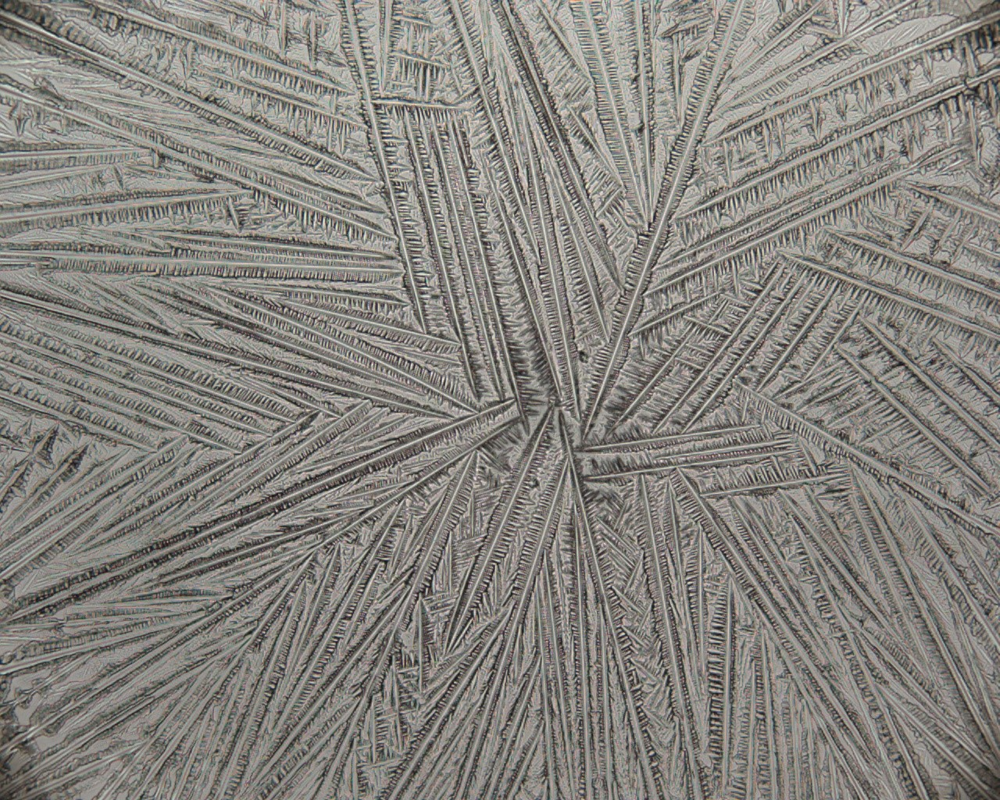

67.26% chino_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA A_2.jpg


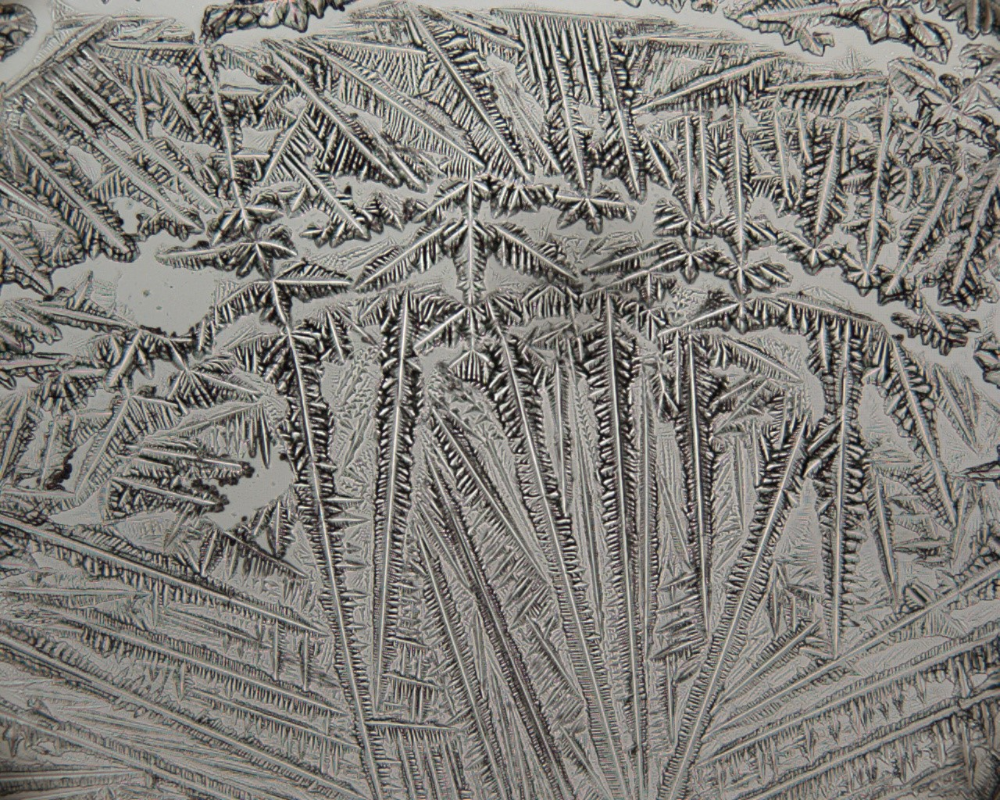

94.16% espadin_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA B.jpg


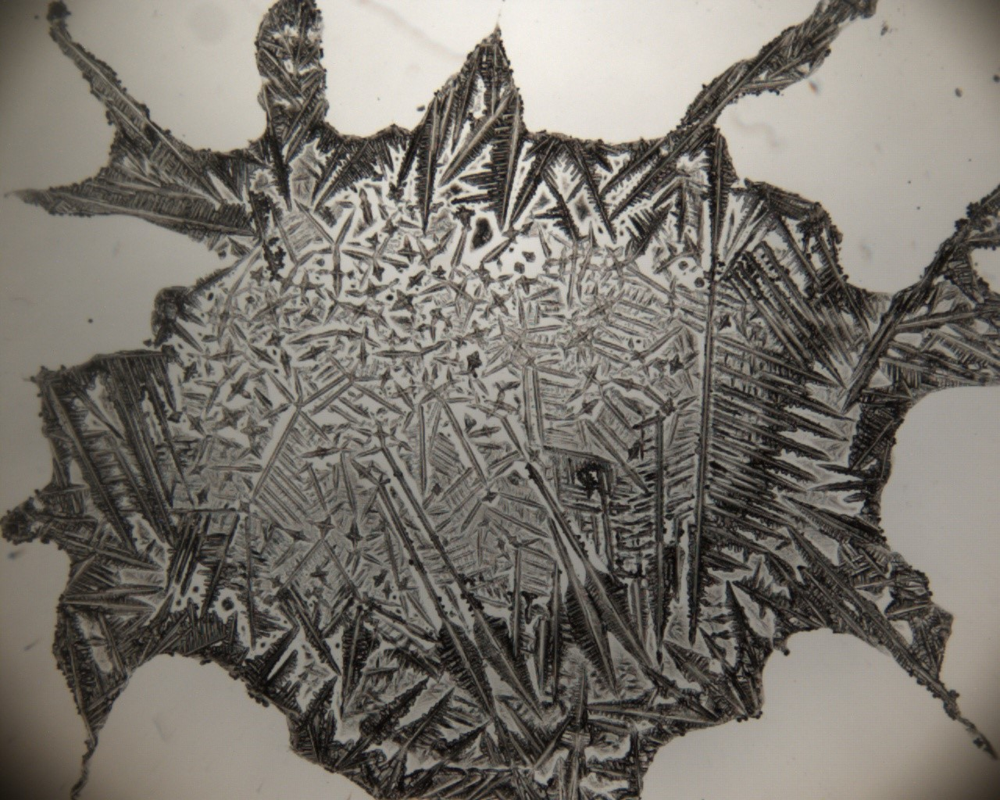

65.13% tobala_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA C.jpg


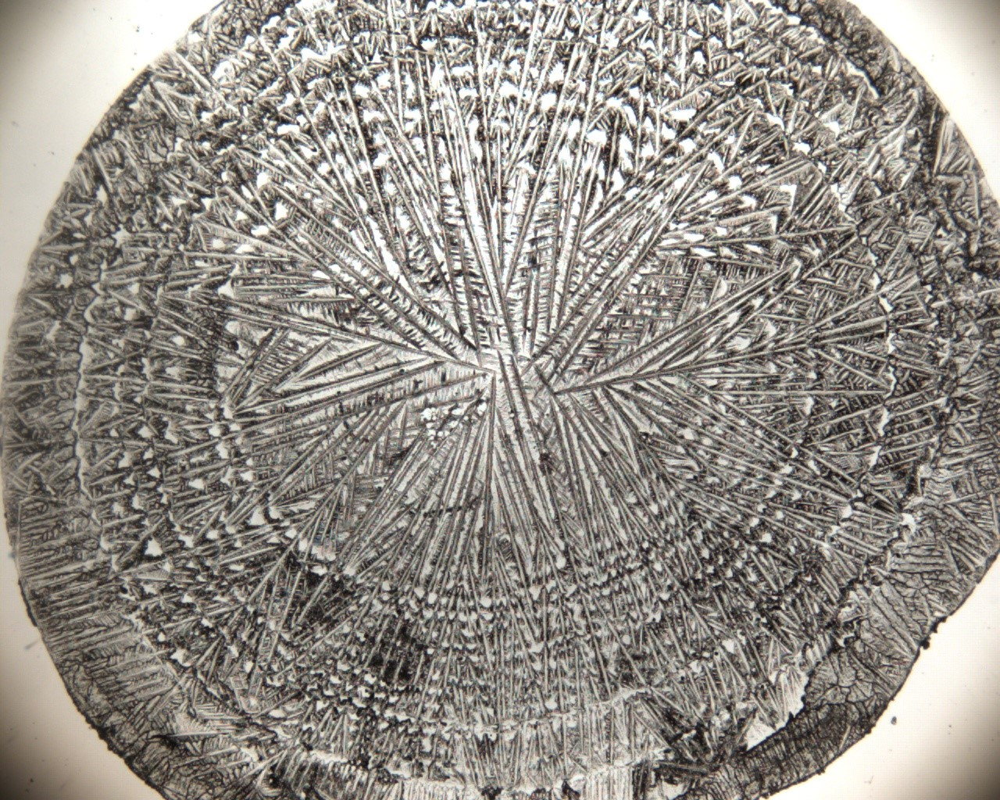

97.26% tobala_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA C_2.jpg


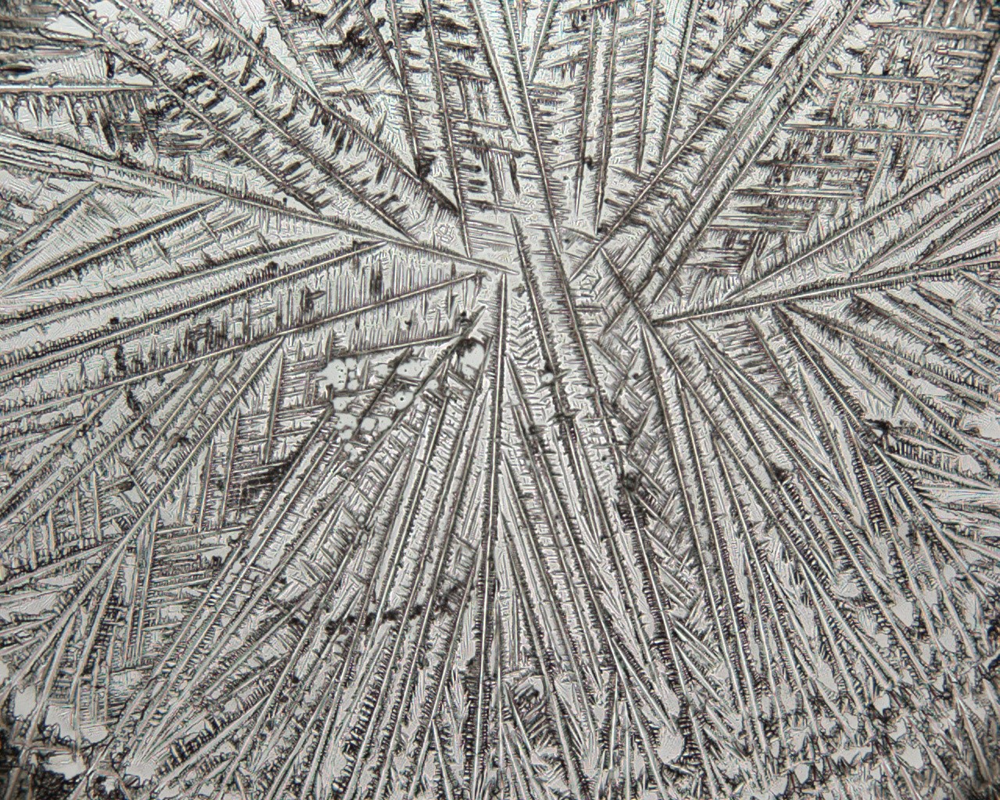

100.00% tobala_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA C_3.jpg


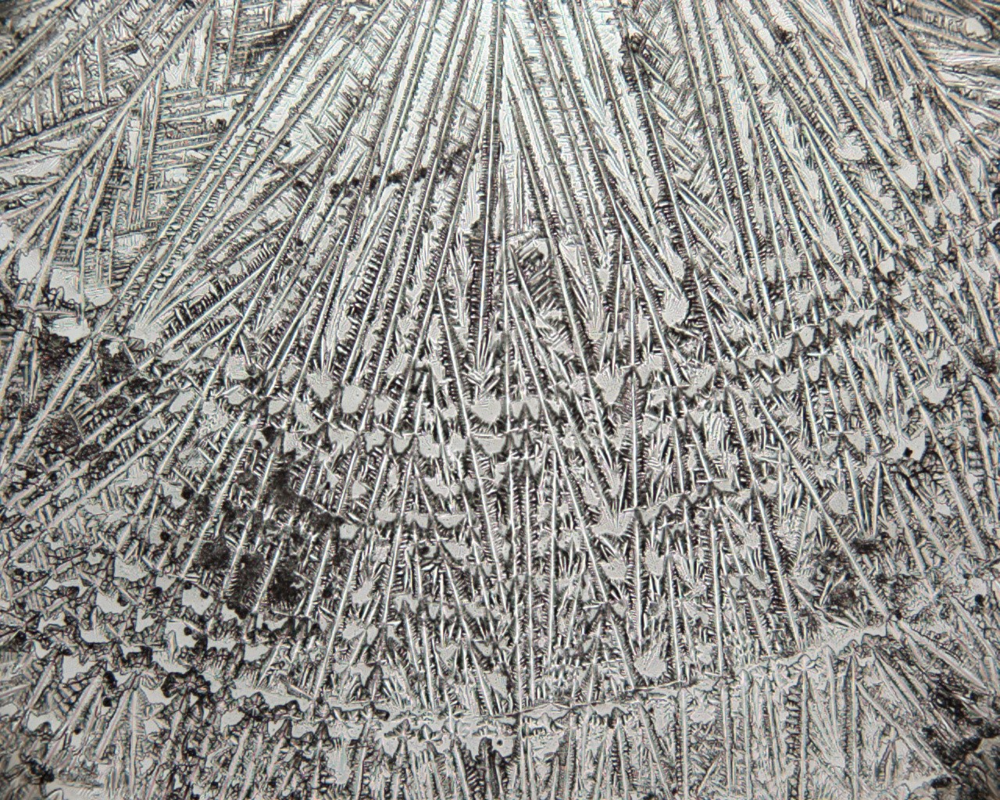

99.98% tobala_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA C_4.jpg


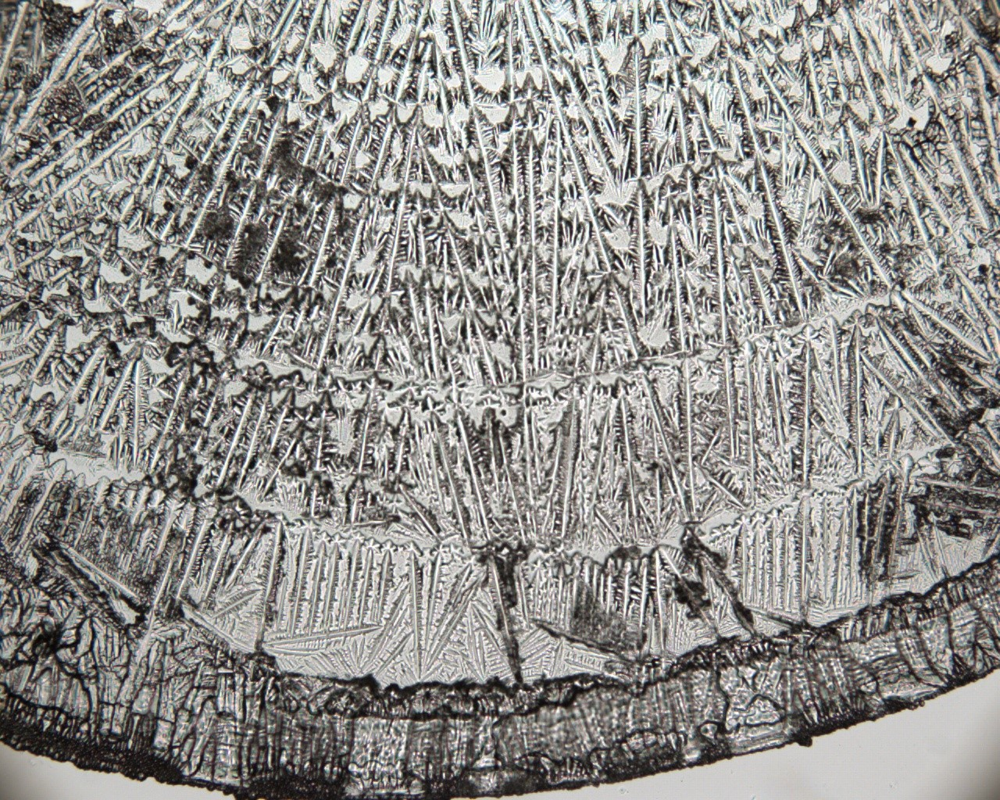

99.75% espadin_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA D.jpg


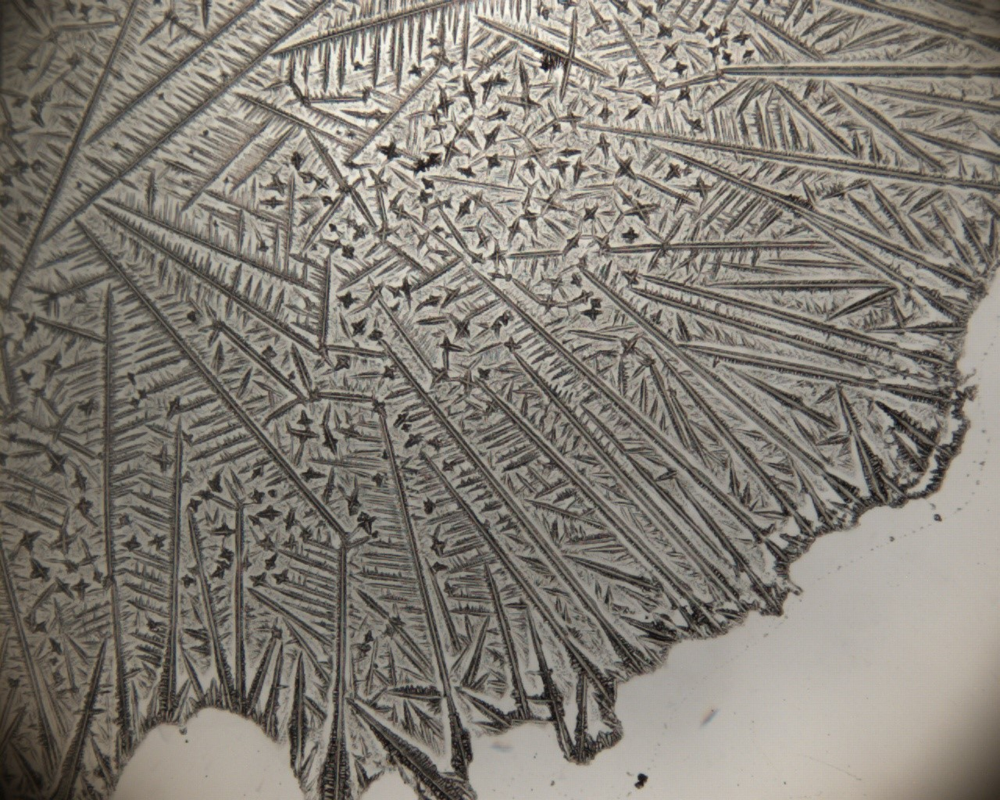

97.10% espadin_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA D_2.jpg


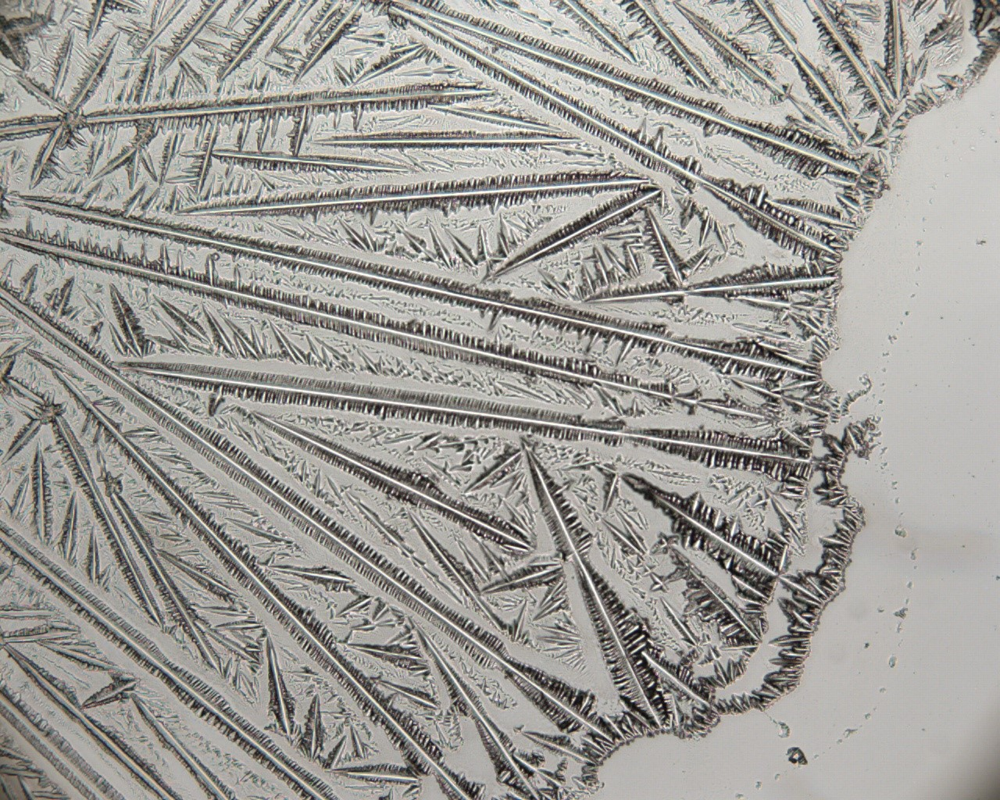

92.11% espadin_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA E.jpg


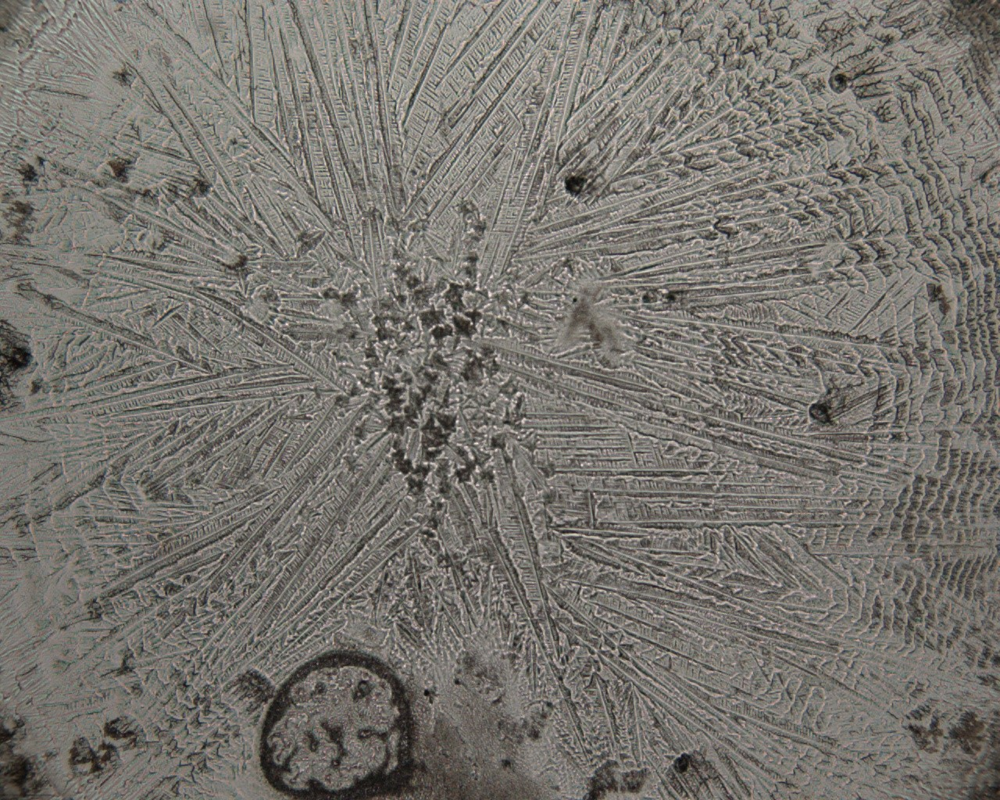

99.33% espadin_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA F.jpg


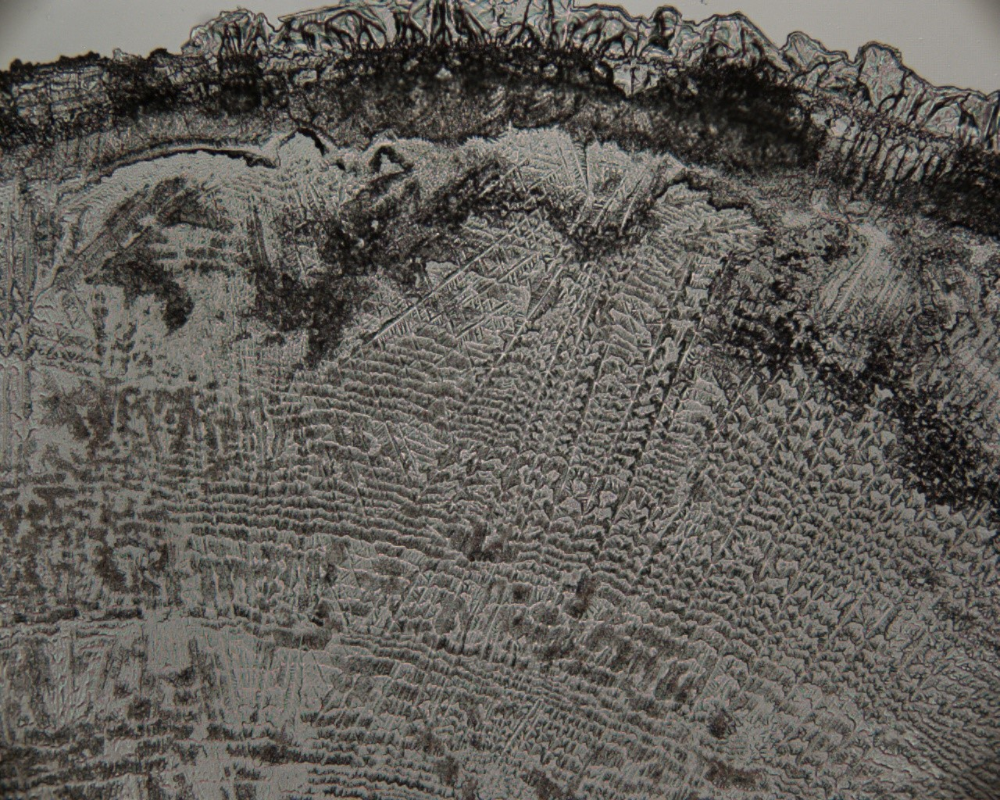

99.99% espadin_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA G.jpg


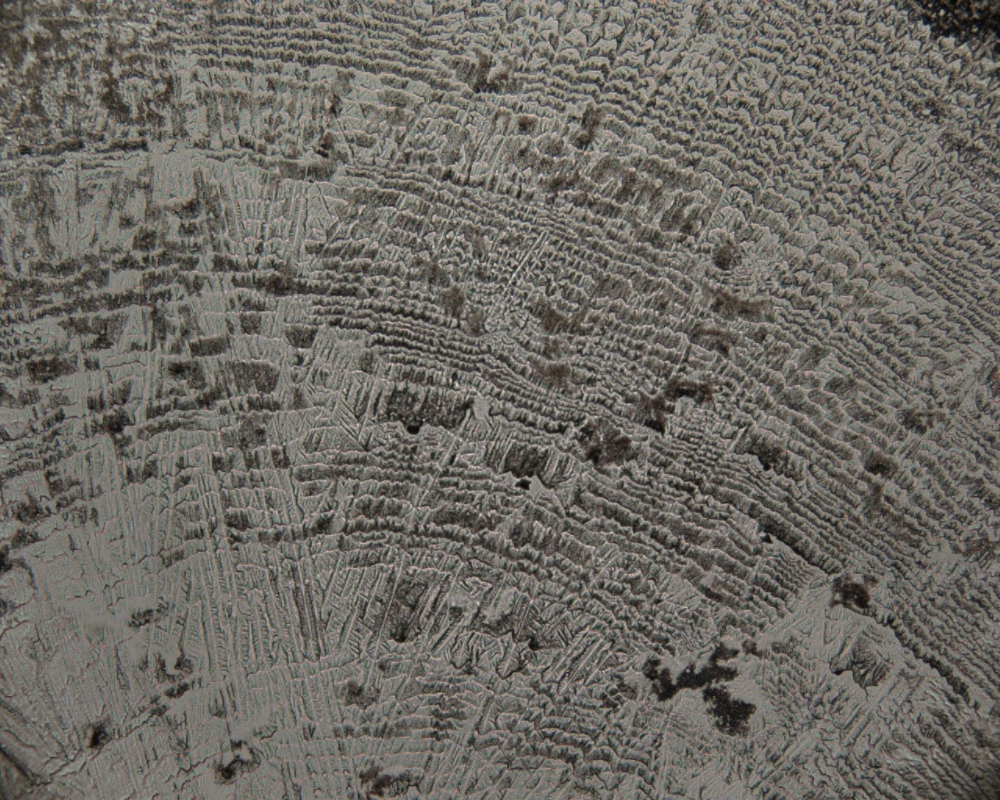

99.92% espadin_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRA H.jpg


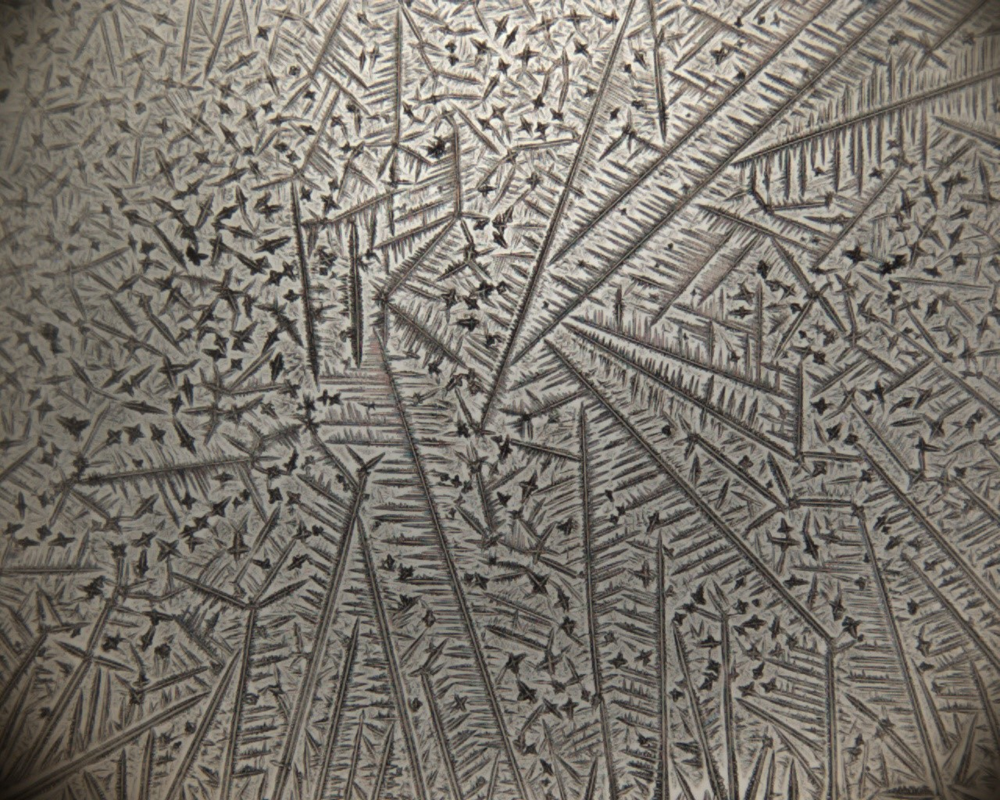

44.29% chino_impuro - D:\ENGINEERING\mezcal\data\test\MUESTRAA.jpg


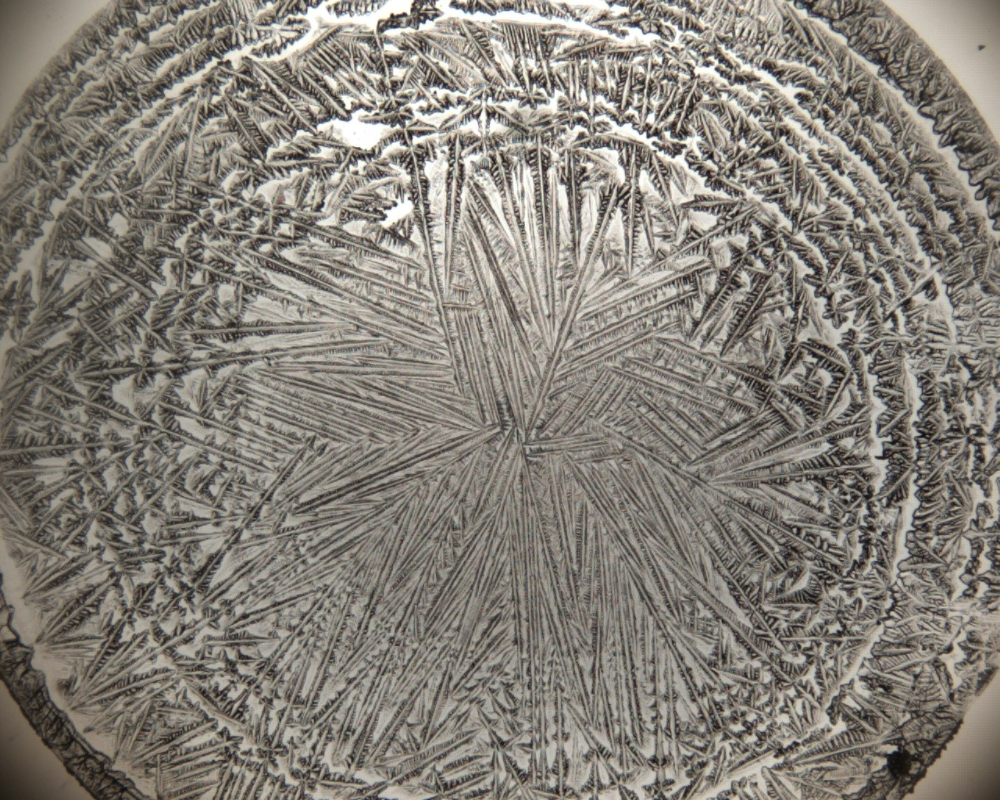

In [36]:
from IPython.display import Image

test_data_dir = get_test_data_dir()

for fname in os.listdir(test_data_dir):
    image_path = os.path.join(test_data_dir, fname)    

    image_object = cv2.imread(image_path)    

    prediction,_,probs = learn.predict(image_object)    
    print(f'{max(100*probs):.2f}% {prediction} - {image_path}')
    image = Image(filename=image_path, width=224)
    display(image)    

In [6]:
interp = ClassificationInterpretation.from_learner(learn)
cm = interp.confusion_matrix()

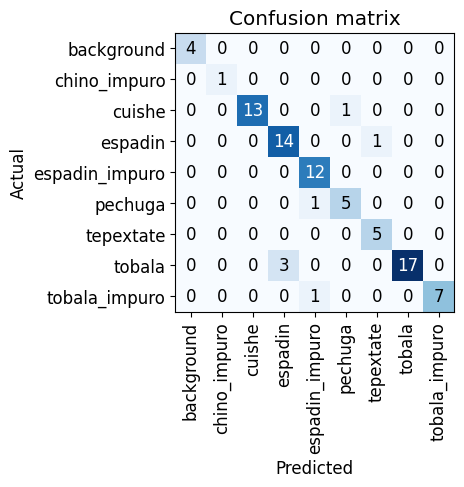

In [17]:
interp.plot_confusion_matrix()

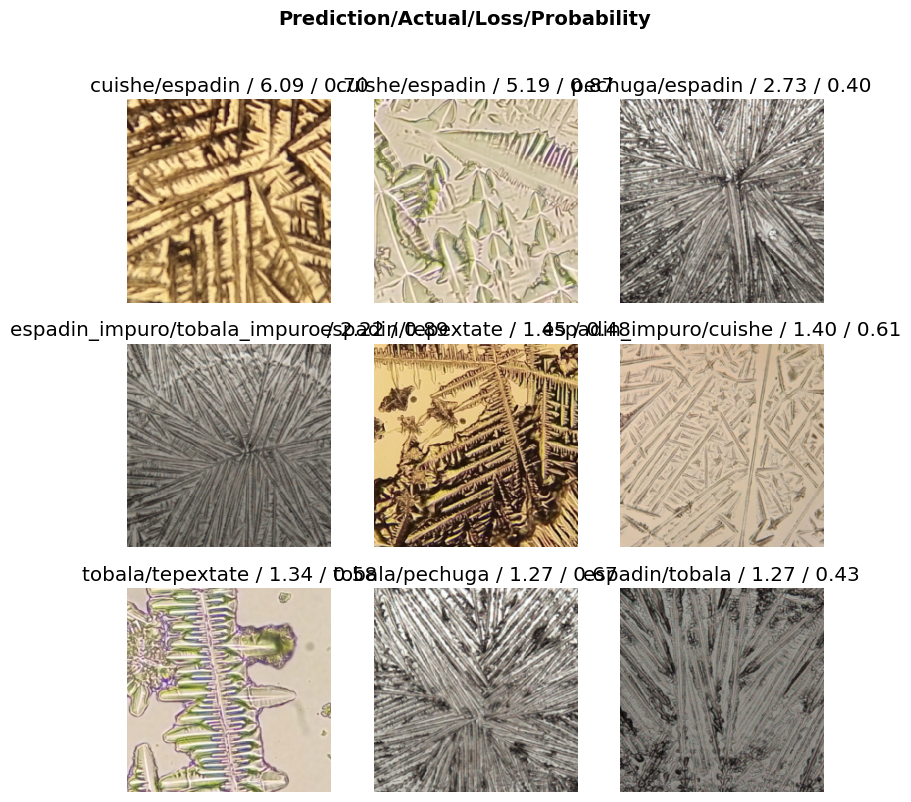

In [7]:
interp.plot_top_losses(9)

In [37]:
# because it wasn't being exported before
learn.export('../models/resnet_50_2023May08_0614PM.pkl')

In [ ]:
with open('../MUESTRAA.jpg', 'rb') as f:
    image_bytes = f.read() 
    transformed = transform_image(image_bytes)

In [ ]:
import io

import torchvision.transforms as transforms
from PIL import Image

def transform_image(image_bytes):
    my_transforms = transforms.Compose([transforms.Resize(255),
                                        transforms.CenterCrop(224),
                                        transforms.ToTensor(),
                                        transforms.Normalize(
                                            [0.485, 0.456, 0.406],
                                            [0.229, 0.224, 0.225])])
    image = Image.open(io.BytesIO(image_bytes))
    return my_transforms(image).unsqueeze(0)

In [ ]:
# Save model’s state dict to a seperate file to call a torch.load() on.
# Will just contain the weights, none of the fastai fancy things 

state_dict_path = f'{learner_path}_state_dict'
torch.save(learn.model.state_dict(), state_dict_path)

In [ ]:
# Load into PyTorch model

model = resnet50()
model.load_state_dict(learn.model.state_dict())
model.eval()

In [ ]:
# INFERENCE TEST

In [ ]:
class_index = json.load(open('../index_to_name.json'))

def get_prediction(image_bytes):
    tensor = transform_image(image_bytes=image_bytes)
    outputs = model.forward(tensor)
    _, y_hat = outputs.max(1)
    predicted_idx = str(y_hat.item())
    return class_index[predicted_idx]

In [ ]:
with open('../MUESTRAA.jpg', 'rb') as f:
    image_bytes = f.read()
    print(get_prediction(image_bytes=image_bytes))

In [ ]:
learn.model["model_state_dict"]

In [ ]:
# Save model using scripting
# SMall
sm = torch.jit.script(model)
save_path = os.path.join(get_models_dir(), f'{learner_filename}.pt')

sm.save(save_path)